In [25]:
import torch
import torch.nn as nn
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
import segmentation_models_pytorch as smp
from tqdm.notebook import tqdm

from torch.optim import *
from torch.utils.data import DataLoader, Dataset, sampler
from torchvision import datasets, transforms
import torchmetrics

import pytorch_lightning as pl
from pytorch_lightning.callbacks import ModelCheckpoint

from PIL import Image
from glob import glob
import sys
import os
import skimage
import random
import gc

import wandb
import warnings
warnings.filterwarnings("ignore")

In [26]:
class DiceLoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(DiceLoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        intersection = (inputs * targets).sum()                            
        dice = (2.*intersection + smooth)/(inputs.sum() + targets.sum() + smooth)  
        return 1 - dice

In [27]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cpu'

In [28]:
class LiTSDataset(Dataset):
    def __init__(self, image_dir, mask_dir, transform=None):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.transform = transform
        self.images = [img for img in os.listdir(image_dir) if not img.endswith('.DS_Store')]
        
    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_name = os.path.join(self.image_dir, self.images[idx])
        mask_name = img_name.replace("images", "labels")
        image = Image.open(img_name).resize((224, 224))
        mask = Image.open(mask_name).resize((224, 224))
        
        image = np.asarray(image)
        mask = np.asarray(mask)
        
        image = image / 255.
        image = np.expand_dims(image, axis=0)
        
        mask = (mask > 0).astype(np.uint8)
        mask = np.expand_dims(mask, axis=0)
            
        return torch.Tensor(image), torch.Tensor(mask).long()

In [29]:
dataset = LiTSDataset("/Users/aadityagour/Desktop/Liver-Segmentation-Using-Monai-and-PyTorch-main/archive/pngimages", "/Users/aadityagour/Desktop/Liver-Segmentation-Using-Monai-and-PyTorch-main/archive/pnglabels")

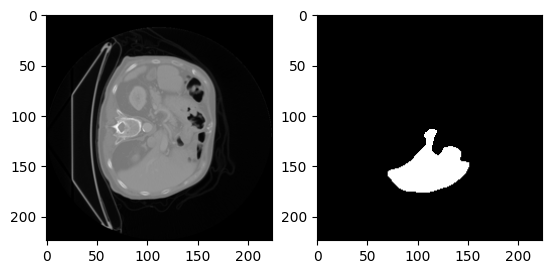

In [30]:
el, mask = random.choice(dataset)
plt.subplot(121)
plt.imshow(el[0], cmap='gray')

plt.subplot(122)
plt.imshow(mask[0], cmap='gray')

In [31]:
train_size = int(0.8 * len(dataset))
val_size = int(0.1 * len(dataset))
test_size = len(dataset) - train_size - val_size
batch_size = 32

train_dataset, test_dataset, val_dataset = torch.utils.data.random_split(dataset, [train_size, test_size, val_size])

In [32]:
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

In [33]:
class LitsModel(pl.LightningModule):
    def __init__(self):
        super().__init__()
        
        self.model = smp.UnetPlusPlus(
            encoder_name='efficientnet-b5',
            encoder_weights=None,
            in_channels=1,
            activation='sigmoid'
        )
        
        self.criterion = DiceLoss()
        
    def forward(self, x):
        return self.model(x)
        
    def training_step(self, batch, batch_idx):
        inputs, truth = batch
        outputs = self(inputs)
        
        loss = self.criterion(outputs, truth)
        self.log('loss/train', loss, prog_bar=True)
        self.log('epoch/loss/train', loss, prog_bar=True, on_epoch=True)
        
        return loss
    
    def validation_step(self, batch, batch_idx):
        inputs, truth = batch
        outputs = self(inputs)
        
        loss = self.criterion(outputs, truth)
        self.log('loss/val', loss, prog_bar=True)
        self.log('epoch/loss/val', loss, prog_bar=True, on_epoch=True)
        self.log('val_loss', loss, prog_bar=True)  # Ensure 'val_loss' is logged
        
        return loss
    
    def test_step(self, batch, batch_idx):
        inputs, truth = batch
        outputs = self(inputs)
        
        loss = self.criterion(outputs, truth)
        self.log('loss/test', loss)
        self.log('dice', 1. - loss.item())
        
    def configure_optimizers(self):
        return torch.optim.RMSprop(self.parameters(), lr=1e-4)
    
    def prediction_step(self, batch, batch_idx, dataloader_idx=0):
        inputs, _ = batch
        return self(inputs)

In [34]:
gc.collect()
torch.cuda.empty_cache()

model = LitsModel()

In [35]:
# Configure the ModelCheckpoint callback
checkpoint_callback = ModelCheckpoint(
    monitor='val_loss',  # Metric to monitor
    dirpath='/Users/aadityagour/Desktop/Liver-Segmentation-Using-Monai-and-PyTorch-main/checkpoints',  # Directory to save the checkpoints
    filename='best-checkpoint',  # Filename for the checkpoint
    save_top_k=1,  # Save only the best model
    mode='min'  # Mode for the monitored metric ('min' or 'max')
)

# Create the Trainer with the checkpoint callback
trainer = pl.Trainer(
    callbacks=[checkpoint_callback],
    max_epochs=5  # You can set this to None for unlimited epochs
)

GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


In [36]:
print("starting training ...")
trainer.fit(model, train_loader, val_loader)

starting training ...



  | Name      | Type         | Params | Mode 
---------------------------------------------------
0 | model     | UnetPlusPlus | 31.9 M | train
1 | criterion | DiceLoss     | 0      | train
---------------------------------------------------
31.9 M    Trainable params
0         Non-trainable params
31.9 M    Total params
127.637   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=5` reached.


In [37]:
trainer.test(model, test_loader)

Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│           dice            │     0.123166523873806     │
│         loss/test         │     0.876833438873291     │
└───────────────────────────┴───────────────────────────┘

[{'loss/test': 0.876833438873291, 'dice': 0.123166523873806}]

In [38]:
inputs = []
predictions = []
truths = []

device = 'cpu'
model = model.to(device)

with torch.no_grad():
    for input, truth in tqdm(test_loader):
        input, truth = input.to(device), truth.to(device)
        pred = model(input)
        
        inputs.append(input)
        predictions.append(pred)
        truths.append(truth)

  0%|          | 0/6 [00:00<?, ?it/s]

In [39]:
inputs2 = torch.cat(inputs).cpu().numpy().squeeze()
predictions2 = torch.cat(predictions).cpu().numpy().squeeze()
truths2 = torch.cat(truths).cpu().numpy().squeeze()

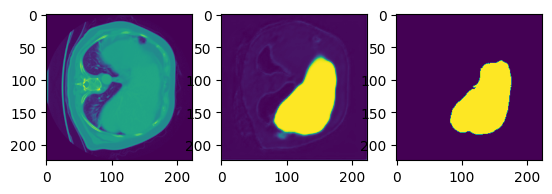

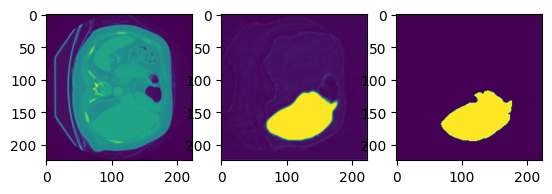

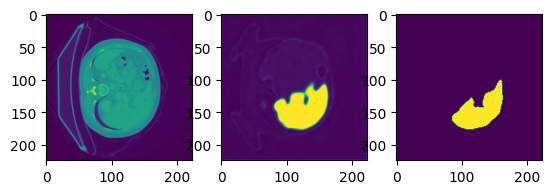

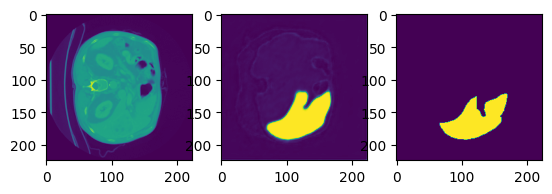

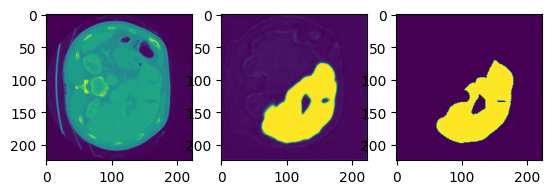

...

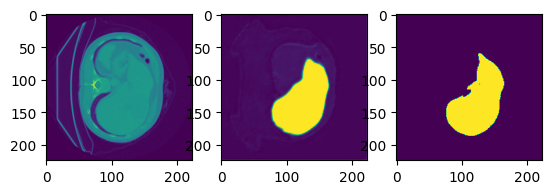

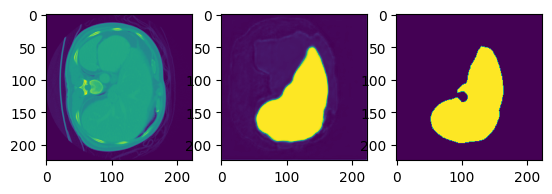

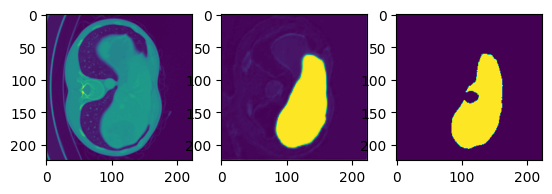

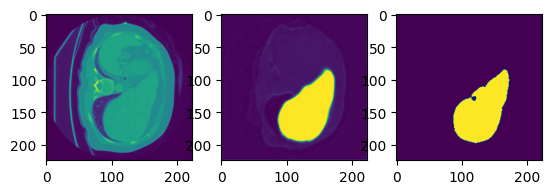

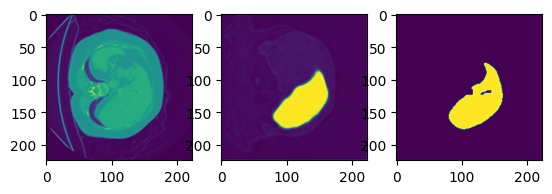

In [40]:
for i, t, p in zip(inputs2, predictions2, truths2):
    plt.subplot(1,3,1)
    plt.imshow(i)
    
    plt.subplot(1,3,2)
    plt.imshow(t)
    
    plt.subplot(1,3,3)
    plt.imshow(p)
    plt.show()